In [ ]:
from sqlalchemy import create_engine
import pandas as pd
import psycopg2
from tqdm.auto import trange
from datetime import datetime
import numpy as np
from itertools import product

In [ ]:
tax_engine = create_engine(f"postgresql+psycopg2://postgres:pw@hostname:5433/nj_tax_assessor")

In [ ]:
pd.set_option('display.max_columns', 999)

# Load the data from PostgreSQL

In [ ]:
query = f"SELECT * FROM gsmls_imputed_data;"
test_data = pd.read_sql_query(query, tax_engine)

In [ ]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 758557 entries, 0 to 758556
Columns: 151 entries, MLSNUM to year_built
dtypes: bool(102), datetime64[ns](2), float64(25), int64(8), object(14)
memory usage: 357.4+ MB


### This data has been further enriched during a merge/join in Apache Spark and not included in this workbook. The columns "year_built", "building_sqft" and "lotsize_sqft" have been pulled from a seperate database

In [ ]:
test_data = test_data[[i for i in test_data.columns if i not in ['SQFTAPPROX', 'YEARBUILT', 'TAX_PATTERN']]]
test_data.insert(23, 'AGE_OF_PROPERTY', test_data['YEAR'] - test_data['year_built'])
test_data.insert(21, 'SQFTAPPROX', test_data.pop('building_sqft'))
test_data.insert(22, 'YEARBUILT', test_data.pop('year_built'))

In [ ]:
test_data.columns

Index(['MLSNUM', 'STATUS_SHORT', 'ADDRESS', 'TOWN', 'COUNTY', 'ZIPCODE',
       'NJ_TOWNCODE', 'TOWNCODE', 'COUNTYCODE', 'BLOCKID',
       ...
       'WATER_PRIVATE', 'WATER_WELL', 'WATER_WATRXTRA', 'UTILITIES_ALLUNDER',
       'UTILITIES_ELECTRIC', 'UTILITIES_GASNATUR', 'UTILITIES_GASINSTR',
       'UTILITIES_GASPROPN', 'LISTING_REMARKS', 'lotsize_sqft'],
      dtype='object', length=149)

# Reduce the number of null and less than 0 values of the lotsize before imputation

In [ ]:
def fix_lot_size(df):

  temp_df = df.copy()

  for _, row in zip(trange(len(temp_df), desc='Rows'), temp_df.iterrows()):
    idx = row[0]
    data = row[1]

    # If the original lot size value is <= 0 and the new lot size value is None, assign the value as 0
    if (data['LOTSIZE (SQFT)'] < 0 or data['LOTSIZE (SQFT)'] == 0) and (data['lotsize_sqft'] < 0 or data['lotsize_sqft'] == 0 or data['lotsize_sqft'] == np.float64(None)):
      df.loc[idx, 'LOTSIZE (SQFT)'] = 0

    # If the original lot size value is <= 0 and the new lot size value is greater than 0 or not None, assign the value as new value
    elif (data['LOTSIZE (SQFT)'] < 0 or data['LOTSIZE (SQFT)'] == 0) and (data['lotsize_sqft'] > 0 and data['lotsize_sqft'] != np.float64(None)):
      df.loc[idx, 'LOTSIZE (SQFT)'] = data['lotsize_sqft']

    # If the original lot size value is not 0 and the new lot size value is 0 or None, leave the original value as is
    elif (data['LOTSIZE (SQFT)'] != 0) and (data['lotsize_sqft'] == 0 or data['lotsize_sqft'] == np.float64(None)):
      pass

    # If the original lot size value is not 0 and the new lot size value is not None or 0 , assign the value as the new value
    elif (data['LOTSIZE (SQFT)'] != 0) and (data['lotsize_sqft'] != 0 or data['lotsize_sqft'] != np.float64(None)):

      if data['LOTSIZE (SQFT)'] > data['lotsize_sqft']:
        df.loc[idx, 'LOTSIZE (SQFT)'] = data['lotsize_sqft']

      else:
        pass

  return df


In [ ]:
test_data = fix_lot_size(test_data)

Rows:   0%|          | 0/758557 [00:00<?, ?it/s]

In [ ]:
pd.set_option('display.max_rows', 5000)

In [ ]:
test_data[['ADDRESS', 'TOWN', 'LOTSIZE (SQFT)', 'lotsize_sqft', 'YEAR']].head(15)

,ADDRESS,TOWN,LOTSIZE (SQFT),lotsize_sqft,YEAR
0,90 Post Kennel Road,Bernardsville Boro,389426.3800,389426.3800,1997
1,3 Pine Hollow,Bernardsville Boro,49658.4000,49658.4000,1996
2,73 Gates Road,Franklin Twp,19998.3960,19998.3960,1996
3,69 Richards Av,Somerville Boro,13068.0000,NaN,1996
4,151 Bernard Dr,Bernards Twp,21780.0000,21780.0000,1997
5,31-33 Mali Drive,North Plainfield Boro,7405.2000,NaN,1996
6,63 Carriage Tr,Montgomery Twp,45707.5080,45707.5080,1996
7,11 Beverly Av,Franklin Twp,14810.4000,15002.0630,1996
8,32 Black Horse Rn,Montgomery Twp,44039.1600,44039.1600,1996
9,2 Conerly Road,Franklin Twp,17920.5840,17920.5840,1996


### Fix the property valuation column "ASSESSTOTAL". Some of the values have been found to not be correct so clean all of them

In [ ]:
def fix_property_valuation(df):

  temp_df = df.copy()

  for _, row in zip(trange(len(temp_df), desc='Rows'), temp_df.iterrows()):
    idx = row[0]
    data = row[1]

    theoretical_value = data['ASSESSAMOUNTBLDG'] + data['ASSESSAMOUNTLAND']
    actual_value = data['ASSESSTOTAL']

    if actual_value != theoretical_value:
      df.loc[idx, 'ASSESSTOTAL'] = theoretical_value

  return df


In [ ]:
test_data = fix_property_valuation(test_data)

Rows:   0%|          | 0/758557 [00:00<?, ?it/s]

In [ ]:
test_data['assess_to_lp_ratio'] = test_data['ASSESSTOTAL'] / test_data['LISTPRICE']

<ipython-input-62-555091a7941f>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_data['assess_to_lp_ratio'] = test_data['ASSESSTOTAL'] / test_data['LISTPRICE']


### Calculate the mean and standard deviation for all of the features which will be used to train the DNN. Organize by town, county and year to impute for null values and to further filter later

In [ ]:
# # After imputing the NJ Tax Data, do another pass through and impute 0 values with local means

agg_data = test_data.groupby(['YEAR', 'COUNTY', 'TOWN']).agg(
    transaction_count=pd.NamedAgg(column='STATUS_SHORT', aggfunc='count'),
    list_price_mean=pd.NamedAgg(column='LISTPRICE', aggfunc='mean'),
    list_price_std=pd.NamedAgg(column='LISTPRICE', aggfunc='std'),
    sales_price_mean=pd.NamedAgg(column='SALESPRICE', aggfunc='mean'),
    sales_price_std=pd.NamedAgg(column='SALESPRICE', aggfunc='std'),
    days_on_market_mean=pd.NamedAgg(column='DAYSONMARKET', aggfunc='mean'),
    days_on_market_std=pd.NamedAgg(column='DAYSONMARKET', aggfunc='std'),
    sq_ft_mean=pd.NamedAgg(column='SQFTAPPROX', aggfunc='mean'),
    sq_ft_std=pd.NamedAgg(column='SQFTAPPROX', aggfunc='std'),
    year_built_mean=pd.NamedAgg(column='YEARBUILT', aggfunc='mean'),
    year_built_std=pd.NamedAgg(column='YEARBUILT', aggfunc='std'),
    age_of_property_mean=pd.NamedAgg(column='AGE_OF_PROPERTY', aggfunc='mean'),
    age_of_property_std=pd.NamedAgg(column='AGE_OF_PROPERTY', aggfunc='std'),
    lot_size_mean=pd.NamedAgg(column='LOTSIZE (SQFT)', aggfunc='mean'),
    lot_size_std=pd.NamedAgg(column='LOTSIZE (SQFT)', aggfunc='std'),
    rooms_mean=pd.NamedAgg(column='ROOMS', aggfunc='mean'),
    rooms_std=pd.NamedAgg(column='ROOMS', aggfunc='std'),
    beds_mean=pd.NamedAgg(column='BEDS', aggfunc='mean'),
    beds_std=pd.NamedAgg(column='BEDS', aggfunc='std'),
    baths_mean=pd.NamedAgg(column='BATHSTOTAL', aggfunc='mean'),
    baths_std=pd.NamedAgg(column='BATHSTOTAL', aggfunc='std'),
    assessment_mean=pd.NamedAgg(column='ASSESSTOTAL', aggfunc='mean'),
    assessment_std=pd.NamedAgg(column='ASSESSTOTAL', aggfunc='std'),
    tax_mean=pd.NamedAgg(column='TAXAMOUNT', aggfunc='mean'),
    tax_std=pd.NamedAgg(column='TAXAMOUNT', aggfunc='std'),
    garages_mean=pd.NamedAgg(column='GARAGECAP', aggfunc='mean'),
    garages_std=pd.NamedAgg(column='GARAGECAP', aggfunc='std'),
    app_fee_mean=pd.NamedAgg(column='APPFEE', aggfunc='mean'),
    app_fee_std=pd.NamedAgg(column='APPFEE', aggfunc='std'),
    assoc_fee_mean=pd.NamedAgg(column='ASSOCFEE', aggfunc='mean'),
    assoc_fee_std=pd.NamedAgg(column='ASSOCFEE', aggfunc='std'),
    fireplace_mean=pd.NamedAgg(column='FIREPLACES', aggfunc='mean'),
    fireplace_std=pd.NamedAgg(column='FIREPLACES', aggfunc='std'),
    assess_to_lp_ratio_mean=pd.NamedAgg(column='assess_to_lp_ratio', aggfunc='mean'),
    assess_to_lp_ratio_std=pd.NamedAgg(column='assess_to_lp_ratio', aggfunc='std'),
)

In [ ]:
agg_data.reset_index(inplace=True)

In [ ]:
agg_data.tail()

,YEAR,COUNTY,TOWN,transaction_count,list_price_mean,list_price_std,sales_price_mean,sales_price_std,days_on_market_mean,days_on_market_std,sq_ft_mean,sq_ft_std,year_built_mean,year_built_std,age_of_property_mean,age_of_property_std,lot_size_mean,lot_size_std,rooms_mean,rooms_std,beds_mean,beds_std,baths_mean,baths_std,assessment_mean,assessment_std,tax_mean,tax_std,garages_mean,garages_std,app_fee_mean,app_fee_std,assoc_fee_mean,assoc_fee_std,fireplace_mean,fireplace_std,assess_to_lp_ratio_mean,assess_to_lp_ratio_std
10336,2025,Warren,Phillipsburg Town,48,286324.770833,89365.668743,286185.291667,96909.635387,47.750000,59.037493,1337.522727,395.571444,1921.477273,29.115239,103.522727,29.115239,6031.244918,6280.814691,7.270833,1.876388,3.083333,0.613096,1.310417,0.533650,105133.333333,49954.538197,4721.854167,2240.936193,0.562500,0.920366,0.000000,0.000000,0.000000,0.000000,0.145833,0.356674,0.366858,0.126752
10337,2025,Warren,Pohatcong Twp,12,325633.333333,110518.294112,337437.500000,104117.073801,34.500000,45.598046,1661.300000,616.680549,1920.500000,70.315559,104.500000,70.315559,31036.499917,54107.929939,7.750000,1.288057,3.000000,0.738549,1.625000,0.760532,174575.000000,56194.954885,7577.333333,2433.484159,1.000000,1.044466,0.000000,0.000000,0.000000,0.000000,0.416667,0.668558,0.550968,0.150165
10338,2025,Warren,Washington Boro,13,322523.000000,106534.786230,342461.538462,124798.915183,32.384615,27.870350,1308.545455,567.572262,1923.272727,30.780159,101.727273,30.780159,10870.565623,5379.742438,6.846154,1.908147,2.846154,0.688737,1.415385,0.499744,124100.000000,43335.551225,6872.538462,2444.709888,0.769231,0.832050,0.000000,0.000000,0.000000,0.000000,0.230769,0.438529,0.392696,0.069383
10339,2025,Warren,Washington Twp,31,509220.967742,167345.062358,400483.870968,227856.332070,37.322581,30.239474,1714.000000,947.209548,1634.758621,760.106367,390.241379,760.106367,47143.160968,38863.349853,8.677419,1.868816,3.419355,0.764818,2.019355,0.524353,220670.967742,99405.594053,9026.870968,4061.674012,1.580645,0.719916,87.096774,187.513440,158.129032,210.771241,0.806452,0.601074,0.467278,0.179829
10340,2025,Warren,White Twp,29,422320.655172,140241.436233,412027.586207,155991.906605,69.758621,54.311703,1870.444444,674.947595,1967.814815,66.082720,57.185185,66.082720,84671.625448,202616.726918,7.724138,2.281863,2.793103,0.818505,1.968966,0.530568,255158.620690,98386.550029,6257.862069,2357.206878,1.586207,0.779984,44.137931,173.504163,149.137931,176.483857,0.724138,1.065583,0.612413,0.153602


In [ ]:
temp_data = test_data.copy()

# Impute null data with mean values for that year, county and municipality

In [ ]:
import math

for _, row in zip(trange(len(test_data), desc='Rows'), temp_data.iterrows()):
  idx = row[0]
  data = row[1]
  mask = agg_data[(agg_data['YEAR'] == data['YEAR']) & (agg_data['COUNTY'] == data['COUNTY']) & (agg_data['TOWN'] == data['TOWN'])]

  if (data['SQFTAPPROX'] == 0) or (data['SQFTAPPROX'] == None) :
    value = agg_data.loc[mask.index, 'sq_ft_mean'].values[0]
    test_data.loc[idx, 'SQFTAPPROX'] = math.floor(value)

  if (data['LOTSIZE (SQFT)'] == 0) or (data['LOTSIZE (SQFT)'] == None) or (data['LOTSIZE (SQFT)'] < 0):
    value = agg_data.loc[mask.index, 'lot_size_mean'].values[0]
    test_data.loc[idx, 'LOTSIZE (SQFT)'] = value

  if (data['YEARBUILT'] == 0) or (data['YEARBUILT'] == None) :
    value = agg_data.loc[mask.index, 'year_built_mean'].values[0]
    test_data.loc[idx, 'YEARBUILT'] = math.floor(value)

  if (data['AGE_OF_PROPERTY'] == 0) or (data['AGE_OF_PROPERTY'] == None) :
    value = agg_data.loc[mask.index, 'age_of_property_mean'].values[0]
    test_data.loc[idx, 'AGE_OF_PROPERTY'] = math.floor(value)


Rows:   0%|          | 0/758557 [00:00<?, ?it/s]

# Recalculate the sales price mean and std using only the sold instances to represent the true values

In [ ]:
for _, year in zip(trange(len(test_data['YEAR'].unique()), desc='Years'), test_data['YEAR'].unique()):
  for _, county in zip(trange(len(test_data['COUNTY'].unique()), desc='County'), test_data['COUNTY'].unique()):

    # Isolate the sold and expired data
    sold_mask = test_data[(test_data['YEAR'] == year) & (test_data['COUNTY'] == county) & (test_data['STATUS_SHORT'] == 'SD')]
    exp_mask = test_data[(test_data['YEAR'] == year) & (test_data['COUNTY'] == county) & (test_data['STATUS_SHORT'] == 'EXP')]

    # Iterate through all the towns to calculate the data
    for _, town in zip(trange(len(sold_mask['TOWN'].unique()), desc='Town'), sold_mask['TOWN'].unique()):
      agg_mask = agg_data[(agg_data['YEAR'] == year) & (agg_data['COUNTY'] == county) & (agg_data['TOWN'] == town)]

      # Isolate the sold and expired data
      # Sales_price mean and std needs to be recalculated without the EXP instances skewing the data
      agg_data.loc[agg_mask.index, 'sold_count'] = len(sold_mask[sold_mask['TOWN'] == town])
      agg_data.loc[agg_mask.index, 'exp_count'] = len(exp_mask[exp_mask['TOWN'] == town])
      agg_data.loc[agg_mask.index, 'sales_price_mean'] = sold_mask[sold_mask['TOWN'] == town]['SALESPRICE'].mean()
      agg_data.loc[agg_mask.index, 'sales_price_std'] = sold_mask[sold_mask['TOWN'] == town]['SALESPRICE'].std()


Years:   0%|          | 0/30 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/38 [00:00<?, ?it/s]

Town:   0%|          | 0/18 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/15 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/7 [00:00<?, ?it/s]

Town:   0%|          | 0/28 [00:00<?, ?it/s]

Town:   0%|          | 0/17 [00:00<?, ?it/s]

Town:   0%|          | 0/14 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/18 [00:00<?, ?it/s]

Town:   0%|          | 0/38 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/15 [00:00<?, ?it/s]

Town:   0%|          | 0/60 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/38 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/14 [00:00<?, ?it/s]

Town:   0%|          | 0/64 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/64 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/60 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/15 [00:00<?, ?it/s]

Town:   0%|          | 0/63 [00:00<?, ?it/s]

Town:   0%|          | 0/8 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/63 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/6 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/61 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/62 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/61 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/54 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/7 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/6 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/62 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/8 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/8 [00:00<?, ?it/s]

Town:   0%|          | 0/7 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/62 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/6 [00:00<?, ?it/s]

Town:   0%|          | 0/64 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/63 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/66 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/15 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/13 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/63 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/64 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/17 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/64 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/17 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/66 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/27 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/65 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/66 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/8 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/65 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/27 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/13 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/65 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/29 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/15 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/8 [00:00<?, ?it/s]

Town:   0%|          | 0/14 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/65 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/27 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/14 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/7 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/63 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/14 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/29 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/18 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/8 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/59 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/15 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
agg_data['sales_rate'] = agg_data['sold_count'] / agg_data['transaction_count']

In [ ]:
agg_data[(agg_data['YEAR'] == 2019) & (agg_data['COUNTY'] == 'Essex')].head(15)

,YEAR,COUNTY,TOWN,transaction_count,list_price_mean,list_price_std,sales_price_mean,sales_price_std,days_on_market_mean,days_on_market_std,sq_ft_mean,sq_ft_std,year_built_mean,year_built_std,age_of_property_mean,age_of_property_std,lot_size_mean,lot_size_std,rooms_mean,rooms_std,beds_mean,beds_std,baths_mean,baths_std,assessment_mean,assessment_std,tax_mean,tax_std,garages_mean,garages_std,app_fee_mean,app_fee_std,assoc_fee_mean,assoc_fee_std,fireplace_mean,fireplace_std,assess_to_lp_ratio_mean,assess_to_lp_ratio_std,sold_count,exp_count,sales_rate
7690,2019,Essex,Belleville Twp,320,2.952051e+05,74115.921276,2.869158e+05,75321.041787,91.184375,97.842368,1257.360390,656.640485,1640.139610,706.492979,378.860390,706.492979,4.337339e+05,6.279285e+06,6.746875,1.785080,2.925000,0.916925,1.661281,0.645526,2.325203e+05,68676.036259,8884.871875,2471.297694,0.803125,0.731291,152.875000,493.211671,70.306250,125.776859,0.309375,0.508153,0.794534,0.166377,247.0,73.0,0.771875
7691,2019,Essex,Bloomfield Twp,347,3.373943e+05,102304.788246,3.424248e+05,111635.073640,63.953890,75.249897,1487.557276,567.289747,1935.486068,25.041003,83.513932,25.041003,1.889502e+05,3.261513e+06,7.057637,1.757599,3.089337,0.919020,1.598847,0.665759,2.642061e+05,78047.711384,10398.072046,3081.490959,0.821326,0.706948,30.043228,168.508077,39.276657,103.583752,0.383285,0.521290,0.801434,0.182561,299.0,48.0,0.861671
7692,2019,Essex,Caldwell Boro Twp,72,4.631021e+05,162311.066964,4.590735e+05,159572.783297,88.013889,92.222098,1770.957746,940.297011,1777.830986,544.650818,241.169014,544.650818,4.610806e+03,7.276895e+03,7.958333,2.352329,3.250000,1.241875,2.097222,0.903042,4.143792e+05,128119.953628,11226.569444,3477.063468,0.958333,0.720671,191.000000,396.562909,85.638889,153.341863,0.819444,0.997552,0.918325,0.157647,60.0,12.0,0.833333
7693,2019,Essex,Cedar Grove Twp,138,5.298919e+05,204752.619249,4.814079e+05,128210.550257,68.318841,69.477086,2062.960938,919.484916,1958.445312,31.771529,60.554688,31.771529,3.241499e+04,1.050075e+05,8.239130,2.087692,3.543478,0.967498,2.142029,0.992954,4.577391e+05,179282.256536,10795.833333,4250.614498,1.391304,0.840879,53.391304,238.027737,61.768116,145.124527,0.739130,0.873823,0.892028,0.197115,110.0,28.0,0.797101
7694,2019,Essex,City Of Orange Twp,147,2.430975e+05,145099.480150,2.266186e+05,134726.077446,101.108844,92.234523,1766.792000,1141.579772,1728.400000,566.236999,290.600000,566.236999,5.620224e+06,4.473104e+07,8.074830,2.774859,3.768707,1.462162,1.916327,0.978540,1.684211e+05,79085.255458,8569.755102,3914.660694,0.734694,0.945983,19.054422,122.251525,35.598639,97.755822,0.557823,1.000885,0.806316,0.338526,106.0,41.0,0.721088
7695,2019,Essex,East Orange City,365,2.199218e+05,83835.904337,2.184093e+05,84509.830555,100.586301,90.237485,1793.425993,710.399244,1869.483755,343.864004,149.516245,343.864004,1.006042e+04,5.394583e+04,8.008219,2.484554,3.956164,1.498441,1.865753,0.804284,1.544896e+05,51981.641424,8182.687671,2695.169522,0.805479,0.953866,9.687671,85.186292,29.624658,105.860570,0.435616,0.690869,0.807988,0.448090,246.0,119.0,0.673973
7696,2019,Essex,Essex Fells Twp,27,1.194203e+06,443235.956529,1.050130e+06,403270.314252,128.814815,85.833039,3778.560000,1070.512380,1954.440000,39.207865,64.560000,39.207865,3.030108e+04,1.356646e+04,11.888889,2.562050,5.000000,1.300887,3.703704,1.086802,1.136811e+06,345482.353254,22263.185185,6776.006624,2.296296,1.170628,0.000000,0.000000,0.000000,0.000000,1.814815,0.962250,0.980035,0.155409,15.0,12.0,0.555556
7697,2019,Essex,Fairfield Twp,118,5.310763e+05,203535.495505,5.074017e+05,192848.713925,83.228814,69.016090,2307.210526,913.769722,1953.026316,186.226309,65.973684,186.226309,1.783167e+04,2.289347e+04,8.313559,2.420352,3.627119,1.002532,2.209322,0.819942,4.163229e+05,182483.556178,9091.389831,3996.084517,1.542373,0.735476,85.762712,350.529287,53.771186,158.247529,0.567797,0.659951,0.828976,0.383666,88.0,30.0,0.745763
7698,2019,Essex,Glen Ridge Boro Twp,80,6.768150e+05,235328.617

# Create Z-Score columns for all of the numerical values to help clean and filter the data further

In [ ]:
# Enrich the test data with local statistics

test_data['list_price_zscore'] = 0.0
test_data['list_to_sales_price_zscore'] = 0.0
test_data['dom_zscore'] = 0.0
test_data['sqft_zscore'] = 0.0
test_data['age_of_property_zscore'] = 0.0
test_data['year_built_zscore'] = 0.0
test_data['lot_size_zscore'] = 0.0
test_data['rooms_zscore'] = 0.0
test_data['beds_zscore'] = 0.0
test_data['baths_zscore'] = 0.0
test_data['assessment_zscore'] = 0.0
test_data['tax_zscore'] = 0.0
test_data['garages_zscore'] = 0.0
test_data['app_fee_zscore'] = 0.0
test_data['assoc_fee_zscore'] = 0.0
test_data['fireplace_zscore'] = 0.0
test_data['sales_rate'] = 0.0
test_data['assess_to_lp_zscore'] = 0.0


for _, year in zip(trange(len(test_data['YEAR'].unique()), desc='Years'), test_data['YEAR'].unique()):
  for _, county in zip(trange(len(test_data['COUNTY'].unique()), desc='County'), test_data['COUNTY'].unique()):

    # Isolate the data for that year and county
    target_mask = test_data[(test_data['YEAR'] == year) & (test_data['COUNTY'] == county)]

    for _, town in zip(trange(len(target_mask['TOWN'].unique()), desc='Town'), target_mask['TOWN'].unique()):
      town_mask = test_data[(test_data['YEAR'] == year) & (test_data['COUNTY'] == county) & (test_data['TOWN'] == town)]
      agg_mask = agg_data[(agg_data['YEAR'] == year) & (agg_data['COUNTY'] == county) & (agg_data['TOWN'] == town)]

      test_data.loc[town_mask.index, 'list_price_zscore'] = (town_mask['LISTPRICE'] - agg_mask['list_price_mean'].values[0]) / agg_mask['list_price_std'].values[0]
      test_data.loc[town_mask.index, 'list_to_sales_price_zscore'] = (town_mask['LISTPRICE'] - agg_mask['sales_price_mean'].values[0]) / agg_mask['sales_price_std'].values[0]
      test_data.loc[town_mask.index, 'dom_zscore'] = (town_mask['DAYSONMARKET'] - agg_mask['days_on_market_mean'].values[0]) / agg_mask['days_on_market_std'].values[0]
      test_data.loc[town_mask.index, 'sqft_zscore'] = (town_mask['SQFTAPPROX'] - agg_mask['sq_ft_mean'].values[0]) / agg_mask['sq_ft_std'].values[0]
      test_data.loc[town_mask.index, 'year_built_zscore'] = (town_mask['YEARBUILT'] - agg_mask['year_built_mean'].values[0]) / agg_mask['year_built_std'].values[0]
      test_data.loc[town_mask.index, 'age_of_property_zscore'] = (town_mask['AGE_OF_PROPERTY'] - agg_mask['age_of_property_mean'].values[0]) / agg_mask['age_of_property_std'].values[0]
      test_data.loc[town_mask.index, 'lot_size_zscore'] = (town_mask['LOTSIZE (SQFT)'] - agg_mask['lot_size_mean'].values[0]) / agg_mask['lot_size_std'].values[0]
      test_data.loc[town_mask.index, 'rooms_zscore'] = (town_mask['ROOMS'] - agg_mask['rooms_mean'].values[0]) / agg_mask['rooms_std'].values[0]
      test_data.loc[town_mask.index, 'beds_zscore'] = (town_mask['BEDS'] - agg_mask['beds_mean'].values[0]) / agg_mask['beds_std'].values[0]
      test_data.loc[town_mask.index, 'baths_zscore'] = (town_mask['BATHSTOTAL'] - agg_mask['baths_mean'].values[0]) / agg_mask['baths_std'].values[0]
      test_data.loc[town_mask.index, 'assessment_zscore'] = (town_mask['ASSESSTOTAL'] - agg_mask['assessment_mean'].values[0]) / agg_mask['assessment_std'].values[0]
      test_data.loc[town_mask.index, 'tax_zscore'] = (town_mask['TAXAMOUNT'] - agg_mask['tax_mean'].values[0]) / agg_mask['tax_std'].values[0]
      test_data.loc[town_mask.index, 'garages_zscore'] = (town_mask['GARAGECAP'] - agg_mask['garages_mean'].values[0]) / agg_mask['garages_std'].values[0]
      test_data.loc[town_mask.index, 'app_fee_zscore'] = (town_mask['APPFEE'] - agg_mask['app_fee_mean'].values[0]) / agg_mask['app_fee_std'].values[0]
      test_data.loc[town_mask.index, 'assoc_fee_zscore'] = (town_mask['ASSOCFEE'] - agg_mask['assoc_fee_mean'].values[0]) / agg_mask['assoc_fee_std'].values[0]
      test_data.loc[town_mask.index, 'fireplace_zscore'] = (town_mask['FIREPLACES'] - agg_mask['fireplace_mean'].values[0]) / agg_mask['fireplace_std'].values[0]
      test_data.loc[town_mask.index, 'sales_rate'] = agg_mask['sales_rate'].values[0]
      test_data.loc[town_mask.index, 'assess_to_lp_zscore'] = (town_mask['assess_to_lp_ratio'] - agg_mask['assess_to_lp_ratio_mean'].values[0]) / agg_mask['assess_to_lp_ratio_std'].values[0]


<ipython-input-71-0e76fd2d7612>:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_data['list_price_zscore'] = 0.0
<ipython-input-71-0e76fd2d7612>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_data['list_to_sales_price_zscore'] = 0.0
<ipython-input-71-0e76fd2d7612>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `ne

Years:   0%|          | 0/30 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/38 [00:00<?, ?it/s]

Town:   0%|          | 0/18 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/15 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/7 [00:00<?, ?it/s]

Town:   0%|          | 0/28 [00:00<?, ?it/s]

Town:   0%|          | 0/17 [00:00<?, ?it/s]

Town:   0%|          | 0/14 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/18 [00:00<?, ?it/s]

Town:   0%|          | 0/38 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/15 [00:00<?, ?it/s]

Town:   0%|          | 0/60 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/38 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/14 [00:00<?, ?it/s]

Town:   0%|          | 0/64 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/6 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/64 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/64 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/64 [00:00<?, ?it/s]

Town:   0%|          | 0/7 [00:00<?, ?it/s]

Town:   0%|          | 0/7 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/40 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/65 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/40 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/13 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/8 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/13 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/66 [00:00<?, ?it/s]

Town:   0%|          | 0/13 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/30 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/18 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/65 [00:00<?, ?it/s]

Town:   0%|          | 0/13 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/17 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/66 [00:00<?, ?it/s]

Town:   0%|          | 0/13 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/66 [00:00<?, ?it/s]

Town:   0%|          | 0/13 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/17 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/6 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/66 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/27 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/6 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/30 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/6 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/65 [00:00<?, ?it/s]

Town:   0%|          | 0/13 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/27 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/6 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/27 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/66 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/31 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/8 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/68 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/30 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/17 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/69 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/29 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/15 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/7 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/29 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/18 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/7 [00:00<?, ?it/s]

Town:   0%|          | 0/14 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/34 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town: 0it [00:00, ?it/s]

Town:   0%|          | 0/7 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/8 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/65 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/27 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/19 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/64 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/28 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/18 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/5 [00:00<?, ?it/s]

Town:   0%|          | 0/7 [00:00<?, ?it/s]

Town:   0%|          | 0/13 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/26 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/67 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/34 [00:00<?, ?it/s]

Town:   0%|          | 0/6 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/18 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/10 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/4 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

County:   0%|          | 0/21 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/24 [00:00<?, ?it/s]

Town:   0%|          | 0/39 [00:00<?, ?it/s]

Town:   0%|          | 0/20 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/22 [00:00<?, ?it/s]

Town:   0%|          | 0/23 [00:00<?, ?it/s]

Town:   0%|          | 0/16 [00:00<?, ?it/s]

Town:   0%|          | 0/59 [00:00<?, ?it/s]

Town:   0%|          | 0/9 [00:00<?, ?it/s]

Town:   0%|          | 0/12 [00:00<?, ?it/s]

Town:   0%|          | 0/25 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/15 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/1 [00:00<?, ?it/s]

Town:   0%|          | 0/11 [00:00<?, ?it/s]

Town:   0%|          | 0/2 [00:00<?, ?it/s]

Town:   0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
column_names = {
    'LISTPRICE': 'list_price_zscore',
    'list_price_zscore': 'list_to_sales_price_zscore',
    'DAYSONMARKET': 'dom_zscore',
    'SQFTAPPROX': 'sqft_zscore',
    'AGE_OF_PROPERTY': 'age_of_property_zscore',
    'YEARBUILT': 'year_built_zscore',
    'LOTSIZE (SQFT)': 'lot_size_zscore',
    'SALESPRICE': 'sales_rate',
    'ROOMS': 'rooms_zscore',
    'BEDS': 'beds_zscore',
    'BATHSTOTAL': 'baths_zscore',
    'ASSESSTOTAL': 'assessment_zscore',
    'TAXAMOUNT': 'tax_zscore',
    'GARAGECAP': 'garages_zscore',
    'APPFEE': 'app_fee_zscore',
    'ASSOCFEE': 'assoc_fee_zscore',
    'FIREPLACES': 'fireplace_zscore',
    'ASSESSTOTAL': 'assess_to_lp_zscore'
}


for k, v in column_names.items():

  target_index = test_data.columns.get_loc(k)
  test_data.insert(target_index + 1, v, test_data.pop(v))

<ipython-input-72-cb27f88e2d79>:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_data.insert(target_index + 1, v, test_data.pop(v))
<ipython-input-72-cb27f88e2d79>:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_data.insert(target_index + 1, v, test_data.pop(v))
<ipython-input-72-cb27f88e2d79>:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To ge

In [ ]:
test_data = test_data.sort_values(by=['YEAR', 'MONTH'])

In [ ]:
test_data.groupby('STATUS_SHORT')['SALESPRICE'].count()

,SALESPRICE
STATUS_SHORT,
EXP,243787
SD,514770


# Reduced the percentage of null values in SQFTAPPROX and YEARBUILT columns from 82% to 20%

In [ ]:
na_data = len(test_data[(test_data['SQFTAPPROX'] == 0) | (test_data['SQFTAPPROX'].isna()) | (test_data['YEARBUILT'] == 0) | (test_data['YEARBUILT'].isna()) | (test_data['AGE_OF_PROPERTY'] == 0) | (test_data['AGE_OF_PROPERTY'].isna())])
print(f'Number of NA values %: {na_data / len(test_data)}')

Number of NA values %: 0.19967385443677932


# Remove residual infinite and null values

In [ ]:
true_test_data = test_data[(~test_data['SQFTAPPROX'].isna()) & (~test_data['YEARBUILT'].isna()) & (~test_data['AGE_OF_PROPERTY'].isna()) & (~test_data['MORTGAGE_RATE'].isna())
                            & (~test_data['list_to_sales_price_zscore'].isna()) & (~test_data['sqft_zscore'].isna()) & (~test_data['age_of_property_zscore'].isna())  & (~test_data['dom_zscore'].isna()) & (~test_data['year_built_zscore'].isna()) & (~test_data['lot_size_zscore'].isna())
                            & (test_data['list_to_sales_price_zscore'] != np.inf) & (test_data['sqft_zscore'] != np.inf) & (test_data['age_of_property_zscore'] != np.inf) & (test_data['dom_zscore'] != np.inf) & (test_data['year_built_zscore'] != np.inf) & (test_data['lot_size_zscore'] != np.inf)
                            & (test_data['list_to_sales_price_zscore'] != -np.inf) & (test_data['sqft_zscore'] != -np.inf) & (test_data['age_of_property_zscore'] != -np.inf) & (test_data['dom_zscore'] != -np.inf) & (test_data['year_built_zscore'] != -np.inf) & (test_data['lot_size_zscore'] != -np.inf)]

In [ ]:
true_test_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 601462 entries, 2017 to 758553
Columns: 168 entries, MLSNUM to assessment_zscore
dtypes: datetime64[ns](2), float64(43), int64(109), object(14)
memory usage: 775.5+ MB


In [ ]:
# Use this data to predict on later
raw_data = true_test_data.copy()

In [ ]:
# Remove other unneeded rows
# LISTING_REMARKS and CONDITION will be used at a later time
skip_list2 = ['MLSNUM', 'STREETNUMDISPLAY', 'STREETNAME', 'TOWN', 'COUNTY',
              'ZIPCODE', 'NJ_TOWNCODE', 'TOWNCODE', 'COUNTYCODE', 'BLOCKID',
              'LOTID', 'TAXID', 'SUBDIVISION', 'CONDITION', 'QTR',
              'LISTDATE', 'CLOSEDDATE', 'DAYS_TO_CLOSE', 'ANTIC_CLOSEDATE_DIFF', 'LISTING_REMARKS']
gsmls_data = true_test_data[[i for i in true_test_data.columns if i not in skip_list2]]

In [ ]:
gsmls_data.describe()

,LATITUDE,LONGITUDE,DAYSONMARKET,dom_zscore,MORTGAGE_RATE,ORIGLISTPRICE,LISTPRICE,list_price_zscore,list_to_sales_price_zscore,OLP/LP%,SALESPRICE,sales_rate,SQFTAPPROX,sqft_zscore,YEARBUILT,year_built_zscore,SP/LP%,INVESTMENT_SALE,AGE_OF_PROPERTY,age_of_property_zscore,POTENTIAL_INVESTMENT,DISTRESSED_SALE,SHORT_SALE,BANK_OWNED,ROOMS,rooms_zscore,BEDS,beds_zscore,BATHSTOTAL,baths_zscore,LOTSIZE (SQFT),lot_size_zscore,ASSESSAMOUNTBLDG,ASSESSAMOUNTLAND,ASSESSTOTAL,assess_to_lp_zscore,TAXAMOUNT,tax_zscore,SUBPROPTYPE_SFH,MONTH,YEAR,EASEMENT_SHORT,GARAGECAP,garages_zscore,FIREPLACES,fireplace_zscore,POOL_SHORT,APPFEE,app_fee_zscore,ASSOCFEE,assoc_fee_zscore,WOOD_FLOORS,MARBLE_FLOORS,TILE_FLOORS,CARPET_FLOORS,VINYL_FLOORS,LAMINATE_FLOORS,STONE_FLOORS,PARQUET_FLOORS,OFF_STREET_PKNG,1_CAR_WIDE,2_CAR_WIDE,WINDOW_AC,CENTRAL_AC,1_UNIT_AC,2_UNITS_AC,3_UNITS_AC,WALL_UNIT_AC,CEILFAN_AC,DUCTLESS_AC,MULTIZONE_AC,HEAT_SRC_NATGAS,HEAT_SRC_ELECTRIC,HEAT_SRC_OILABV,HEAT_SRC_OILBEL,HEAT_SRC_SOLAR,BASEDESC_BILCOSTY,BASEDESC_FINISHED,BASEDESC_FINPART,BASEDESC_FRNCHDRN,BASEDESC_FULL,BASEDESC_PARTIAL,BASEDESC_SLAB,BASEDESC_UNFINISH,BASEDESC_WALKOUT,BASEDESC_NONE,EXTERIOR_SHORT_DECK,EXTERIOR_ENCLPRCH,EXTERIOR_FENCPRIV,EXTERIOR_FENCVNYL,EXTERIOR_FENCWOOD,EXTERIOR_GAZEBO,EXTERIOR_HOTTUB,EXTERIOR_METALFNC,EXTERIOR_OPENPRCH,EXTERIOR_OUTDRKIT,EXTERIOR_PATIO,EXTERIOR_PERGOLA,EXTERIOR_SPRINKLR,EXTERIOR_STORAGE,EXTERIOR_WORKSHOP,ROOF_ASPHSHNG,ROOF_COMPSHNG,ROOF_FLAT,SIDING_ALUMINUM,SIDING_BRICK,SIDING_CEDARSID,SIDING_CLAPBRD,SIDING_COMPSHNG,SIDING_COMPSIDE,SIDING_CONCBRD,SIDING_METAL,SIDING_STONE,SIDING_STUCCO,SIDING_VERTICAL,SIDING_VINYL,SIDING_WOOD,SIDING_WOODSHNG,HEATSYSTEM_1UNIT,HEATSYSTEMT_2UNITS,HEATSYSTEM_3UNITS,HEATSYSTEM_4UNITS,HEATSYSTEM_BSBDCAST,HEATSYSTEM_BSBDELEC,HEATSYSTEM_BSBDHOTW,HEATSYSTEM_FORCEDHA,HEATSYSTEM_MULTIZON,HEATSYSTEM_RDNTHOTW,HEATSYSTEM_RDTRHOTW,HEATSYSTEM_RDTRSTM,HEATSYSTEM_REGISTER,SEWER_ASSOCTN,SEWER_PUBLAVAL,SEWER_PUBLIC,SEWER_SEPTIC,WATER_ASSOCTN,WATER_PUBLIC,WATER_PRIVATE,WATER_WELL,WATER_WATRXTRA,UTILITIES_ALLUNDER,UTILITIES_ELECTRIC,UTILITIES_GASNATUR,UTILITIES_GASINSTR,UTILITIES_GASPROPN,lotsize_sqft,assess_to_lp_ratio,assessment_zscore
count,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,6.014620e+05,6.014620e+05,601462.000000,601462.000000,601462.000000,6.014620e+05,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601411.000000,601462.000000,601282.000000,601462.000000,601374.000000,6.014620e+05,601462.000000,6.014620e+05,601462.000000,6.014620e+05,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601005.000000,601462.000000,599911.000000,601462.00000,601462.000000,484826.000000,601462.000000,567078.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.00000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601462.000000,601

# Run descriptive statistics on data to filter outliers

In [ ]:
target_col = ['DAYSONMARKET', 'dom_zscore', 'LISTPRICE', 'list_price_zscore', 'list_to_sales_price_zscore',
              'OLP/LP%', 'SALESPRICE', 'ROOMS', 'rooms_zscore', 'SQFTAPPROX', 'sqft_zscore',
              'LOTSIZE (SQFT)', 'lot_size_zscore', 'BEDS', 'beds_zscore', 'BATHSTOTAL', 'baths_zscore',
              'ASSESSTOTAL', 'assessment_zscore', 'TAXAMOUNT', 'tax_zscore',
              'YEARBUILT', 'year_built_zscore', 'GARAGECAP', 'garages_zscore', 'FIREPLACES', 'fireplace_zscore',
              'sales_rate', 'AGE_OF_PROPERTY', 'MONTH', 'YEAR', 'MORTGAGE_RATE', 'LONGITUDE', 'LATITUDE',
              'assess_to_lp_ratio', 'assess_to_lp_zscore']

iqr_dict = {
    'col': [],
    'q1': [],
    'q3': [],
    'iqr': [],
    'lower_bound': [],
    'upper_bound': [],
    'min': [],
    'max': [],
    'skew': []
}

for col in target_col:
  max_val = gsmls_data[col].max()
  min_val =gsmls_data[col].min()
  skew = gsmls_data[col].skew()
  q1 = float(gsmls_data[col].quantile([0.25]).values[0])
  q3 = float(gsmls_data[col].quantile([0.75]).values[0])
  iqr = q3 - q1
  lower_bound = q1 - (1.5 * iqr)
  upper_bound = q3 + (1.5 * iqr)
  iqr_dict['col'].append(col)
  iqr_dict['q1'].append(q1)
  iqr_dict['q3'].append(q3)
  iqr_dict['iqr'].append(iqr)
  iqr_dict['lower_bound'].append(lower_bound)
  iqr_dict['upper_bound'].append(upper_bound)
  iqr_dict['max'].append(max_val)
  iqr_dict['min'].append(min_val)
  iqr_dict['skew'].append(skew)

iqr_df = pd.DataFrame(iqr_dict)
iqr_df.set_index('col', inplace=True)

In [ ]:
"""
Imputations for the current data:
DAYSONMARKET: mean for that year and location
SQFTAPPROX: nj_tax_data and if that doesnt work, mean for that year and location
"""
iqr_df

,q1,q3,iqr,lower_bound,upper_bound,min,max,skew
col,,,,,,,,
DAYSONMARKET,26.000000,177.000000,151.000000,-200.500000,4.035000e+02,0.000000,9.000000e+02,1.861658
dom_zscore,-0.708142,0.471052,1.179194,-2.476933,2.239843e+00,-2.363317,1.231967e+01,1.605142
LISTPRICE,245000.000000,535000.000000,290000.000000,-190000.000000,9.700000e+05,10000.000000,7.200000e+06,3.034392
list_price_zscore,-0.639010,0.473568,1.112578,-2.307878,2.142435e+00,-3.685211,1.746106e+01,1.501817
list_to_sales_price_zscore,-0.575713,0.746929,1.322642,-2.559676,2.730892e+00,-28.284271,8.555992e+01,5.484189
OLP/LP%,-4.000000,0.000000,4.000000,-10.000000,6.000000e+00,-59.000000,5.900000e+01,-2.311506
SALESPRICE,0.000000,430000.000000,430000.000000,-645000.000000,1.075000e+06,0.000000,5.000000e+06,1.854023
ROOMS,6.000000,9.000000,3.000000,1.500000,1.350000e+01,2.000000,2.500000e+01,0.868877
rooms_zscore,-0.657618,0.577840,1.235458,-2.510805,2.431028e+00,-3.480899,8.442802e+00,0.667813


In [ ]:
def property_valuation(val):

  if val < -1.842767: # The lower the assess_to_lp_zscore, the more overvalued the property

    return -1

  elif val > 1.724696: # The higher the assess_to_lp_zscore, the more undervalued the property

    return 1

  else:

    return 0

In [ ]:
gsmls_data['property_valuation'] = gsmls_data['assess_to_lp_zscore'].apply(property_valuation)

<ipython-input-84-8d581e0accec>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  gsmls_data['property_valuation'] = gsmls_data['assess_to_lp_zscore'].apply(property_valuation)
<ipython-input-84-8d581e0accec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gsmls_data['property_valuation'] = gsmls_data['assess_to_lp_zscore'].apply(property_valuation)


In [ ]:
gsmls_data.insert(10, 'property_valuation', gsmls_data.pop('property_valuation'))

<ipython-input-85-0ab6d59e69cd>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  gsmls_data.insert(10, 'property_valuation', gsmls_data.pop('property_valuation'))


In [ ]:
gsmls_data.insert(11, 'assess_to_lp_zscore', gsmls_data.pop('assess_to_lp_zscore'))

<ipython-input-86-11a5a98830fb>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  gsmls_data.insert(11, 'assess_to_lp_zscore', gsmls_data.pop('assess_to_lp_zscore'))


In [ ]:
# Filter out the outliers again
max_age = gsmls_data['YEAR'].max() - 1600
gsmls_data = gsmls_data[(gsmls_data['SQFTAPPROX'] > 500) & (gsmls_data['YEARBUILT'] > 1600)
                        & (gsmls_data['YEARBUILT'] <= gsmls_data['YEAR'].max())
                        & (gsmls_data['AGE_OF_PROPERTY'] > 0) & (gsmls_data['AGE_OF_PROPERTY'] <= max_age)
                        & (gsmls_data['list_price_zscore'] < 5)
                        & (gsmls_data['list_to_sales_price_zscore'] > -5) & (gsmls_data['list_to_sales_price_zscore'] < 5)
                        & (gsmls_data['dom_zscore'] < 5) & (gsmls_data['sqft_zscore'] < 5)
                        & (gsmls_data['age_of_property_zscore'] > -5) & (gsmls_data['age_of_property_zscore'] < 5)
                        & (gsmls_data['lot_size_zscore'] < 5) & (gsmls_data['LOTSIZE (SQFT)'] > 0)
                        & (gsmls_data['assessment_zscore'] < 5)
                        & (gsmls_data['tax_zscore'] < 5) & (gsmls_data['garages_zscore'] < 5)
                        & (gsmls_data['rooms_zscore'] < 5) & (gsmls_data['beds_zscore'] < 5)
                        & (gsmls_data['baths_zscore'] < 5) & (gsmls_data['fireplace_zscore'] < 5)]

# List of attributes which will receive Yeo-Johnson and MaxAbsScaler transformations when training the DNN

In [ ]:
from sklearn.preprocessing import PowerTransformer
from scipy.stats import skew as sci_skew

trans_dict = {
    'col': [],
    'reg_skew': [],
    'Yeo-Johnson_skew': [],
    'Power_Transform': [],
    'Max_Abs_Scaled': []
}

power_transform_cols = []
max_abs_cols = []
target_col.append('property_valuation')

pt = PowerTransformer(method='yeo-johnson')

for col in target_col:
  if 'zscore' not in col:
    trans_dict['col'].append(col)
    skew = gsmls_data[col].skew()
    min_val = gsmls_data[col].min()
    max_val = gsmls_data[col].max()
    trans_dict['reg_skew'].append(skew)
    data = pt.fit_transform(gsmls_data[col].values.reshape(-1,1))

    if skew < -0.8 or skew > 0.8:
      power_transform_cols.append(col)
      trans_dict['Yeo-Johnson_skew'].append(sci_skew(data)[0])
      trans_dict['Power_Transform'].append(True)
    else:
      trans_dict['Yeo-Johnson_skew'].append(skew)
      trans_dict['Power_Transform'].append(False)

    max_abs_cols.append(col)
    trans_dict['Max_Abs_Scaled'].append(True)

trans_df = pd.DataFrame(trans_dict)
trans_df.set_index('col', inplace=True)

In [ ]:
trans_df

,reg_skew,Yeo-Johnson_skew,Power_Transform,Max_Abs_Scaled
col,,,,
DAYSONMARKET,1.747818,-0.069019,True,True
LISTPRICE,2.357349,0.013823,True,True
OLP/LP%,-2.332654,1.799088,True,True
SALESPRICE,1.752694,-0.712074,True,True
ROOMS,0.809506,0.001520,True,True
SQFTAPPROX,1.572363,0.001177,True,True
LOTSIZE (SQFT),62.425496,-0.350772,True,True
BEDS,0.316502,0.316502,False,True
BATHSTOTAL,1.113443,0.023648,True,True


In [ ]:
gsmls_data.describe()

,LATITUDE,LONGITUDE,DAYSONMARKET,dom_zscore,MORTGAGE_RATE,ORIGLISTPRICE,LISTPRICE,list_price_zscore,property_valuation,assess_to_lp_zscore,list_to_sales_price_zscore,OLP/LP%,SALESPRICE,sales_rate,SQFTAPPROX,sqft_zscore,YEARBUILT,year_built_zscore,SP/LP%,INVESTMENT_SALE,AGE_OF_PROPERTY,age_of_property_zscore,POTENTIAL_INVESTMENT,DISTRESSED_SALE,SHORT_SALE,BANK_OWNED,ROOMS,rooms_zscore,BEDS,beds_zscore,BATHSTOTAL,baths_zscore,LOTSIZE (SQFT),lot_size_zscore,ASSESSAMOUNTBLDG,ASSESSAMOUNTLAND,ASSESSTOTAL,TAXAMOUNT,tax_zscore,SUBPROPTYPE_SFH,MONTH,YEAR,EASEMENT_SHORT,GARAGECAP,garages_zscore,FIREPLACES,fireplace_zscore,POOL_SHORT,APPFEE,app_fee_zscore,ASSOCFEE,assoc_fee_zscore,WOOD_FLOORS,MARBLE_FLOORS,TILE_FLOORS,CARPET_FLOORS,VINYL_FLOORS,LAMINATE_FLOORS,STONE_FLOORS,PARQUET_FLOORS,OFF_STREET_PKNG,1_CAR_WIDE,2_CAR_WIDE,WINDOW_AC,CENTRAL_AC,1_UNIT_AC,2_UNITS_AC,3_UNITS_AC,WALL_UNIT_AC,CEILFAN_AC,DUCTLESS_AC,MULTIZONE_AC,HEAT_SRC_NATGAS,HEAT_SRC_ELECTRIC,HEAT_SRC_OILABV,HEAT_SRC_OILBEL,HEAT_SRC_SOLAR,BASEDESC_BILCOSTY,BASEDESC_FINISHED,BASEDESC_FINPART,BASEDESC_FRNCHDRN,BASEDESC_FULL,BASEDESC_PARTIAL,BASEDESC_SLAB,BASEDESC_UNFINISH,BASEDESC_WALKOUT,BASEDESC_NONE,EXTERIOR_SHORT_DECK,EXTERIOR_ENCLPRCH,EXTERIOR_FENCPRIV,EXTERIOR_FENCVNYL,EXTERIOR_FENCWOOD,EXTERIOR_GAZEBO,EXTERIOR_HOTTUB,EXTERIOR_METALFNC,EXTERIOR_OPENPRCH,EXTERIOR_OUTDRKIT,EXTERIOR_PATIO,EXTERIOR_PERGOLA,EXTERIOR_SPRINKLR,EXTERIOR_STORAGE,EXTERIOR_WORKSHOP,ROOF_ASPHSHNG,ROOF_COMPSHNG,ROOF_FLAT,SIDING_ALUMINUM,SIDING_BRICK,SIDING_CEDARSID,SIDING_CLAPBRD,SIDING_COMPSHNG,SIDING_COMPSIDE,SIDING_CONCBRD,SIDING_METAL,SIDING_STONE,SIDING_STUCCO,SIDING_VERTICAL,SIDING_VINYL,SIDING_WOOD,SIDING_WOODSHNG,HEATSYSTEM_1UNIT,HEATSYSTEMT_2UNITS,HEATSYSTEM_3UNITS,HEATSYSTEM_4UNITS,HEATSYSTEM_BSBDCAST,HEATSYSTEM_BSBDELEC,HEATSYSTEM_BSBDHOTW,HEATSYSTEM_FORCEDHA,HEATSYSTEM_MULTIZON,HEATSYSTEM_RDNTHOTW,HEATSYSTEM_RDTRHOTW,HEATSYSTEM_RDTRSTM,HEATSYSTEM_REGISTER,SEWER_ASSOCTN,SEWER_PUBLAVAL,SEWER_PUBLIC,SEWER_SEPTIC,WATER_ASSOCTN,WATER_PUBLIC,WATER_PRIVATE,WATER_WELL,WATER_WATRXTRA,UTILITIES_ALLUNDER,UTILITIES_ELECTRIC,UTILITIES_GASNATUR,UTILITIES_GASINSTR,UTILITIES_GASPROPN,lotsize_sqft,assess_to_lp_ratio,assessment_zscore
count,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,5.557050e+05,5.557050e+05,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,5.557050e+05,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,5.557050e+05,555705.000000,5.557050e+05,555705.000000,5.557050e+05,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,448375.000000,555705.000000,523777.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.00000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.000000,555705.0000

In [ ]:
print(f'Power Transform Columns: {power_transform_cols}')
print(f'Min Max Columns: {max_abs_cols}')

Power Transform Columns: ['DAYSONMARKET', 'LISTPRICE', 'OLP/LP%', 'SALESPRICE', 'ROOMS', 'SQFTAPPROX', 'LOTSIZE (SQFT)', 'BATHSTOTAL', 'ASSESSTOTAL', 'TAXAMOUNT', 'YEARBUILT', 'FIREPLACES', 'AGE_OF_PROPERTY', 'assess_to_lp_ratio', 'property_valuation']
Min Max Columns: ['DAYSONMARKET', 'LISTPRICE', 'OLP/LP%', 'SALESPRICE', 'ROOMS', 'SQFTAPPROX', 'LOTSIZE (SQFT)', 'BEDS', 'BATHSTOTAL', 'ASSESSTOTAL', 'TAXAMOUNT', 'YEARBUILT', 'GARAGECAP', 'FIREPLACES', 'sales_rate', 'AGE_OF_PROPERTY', 'MONTH', 'YEAR', 'MORTGAGE_RATE', 'LONGITUDE', 'LATITUDE', 'assess_to_lp_ratio', 'property_valuation']


In [ ]:
from itertools import product
target_col_plot = ['dom_zscore', 'dom_zscore', 'list_price_zscore', 'list_price_zscore', 'OLP/LP%', 'OLP/LP%',
              'SALESPRICE', 'SALESPRICE', 'rooms_zscore', 'rooms_zscore', 'baths_zscore', 'baths_zscore',
              'sqft_zscore', 'sqft_zscore', 'lot_size_zscore', 'lot_size_zscore', 'beds_zscore', 'beds_zscore',
                   'list_to_sales_price_zscore', 'list_to_sales_price_zscore', 'assessment_zscore', 'assessment_zscore', 'tax_zscore',
                   'tax_zscore', 'year_built_zscore', 'year_built_zscore', 'garages_zscore',	'garages_zscore', 'app_fee_zscore',
                   'app_fee_zscore', 'assoc_fee_zscore', 'assoc_fee_zscore',
                   'LATITUDE', 'LATITUDE', 'LONGITUDE', 'LONGITUDE', 'fireplace_zscore', 'fireplace_zscore']
axises = product([0, 1, 2, 3, 4, 5, 6], [0, 1, 2, 3, 4, 5])

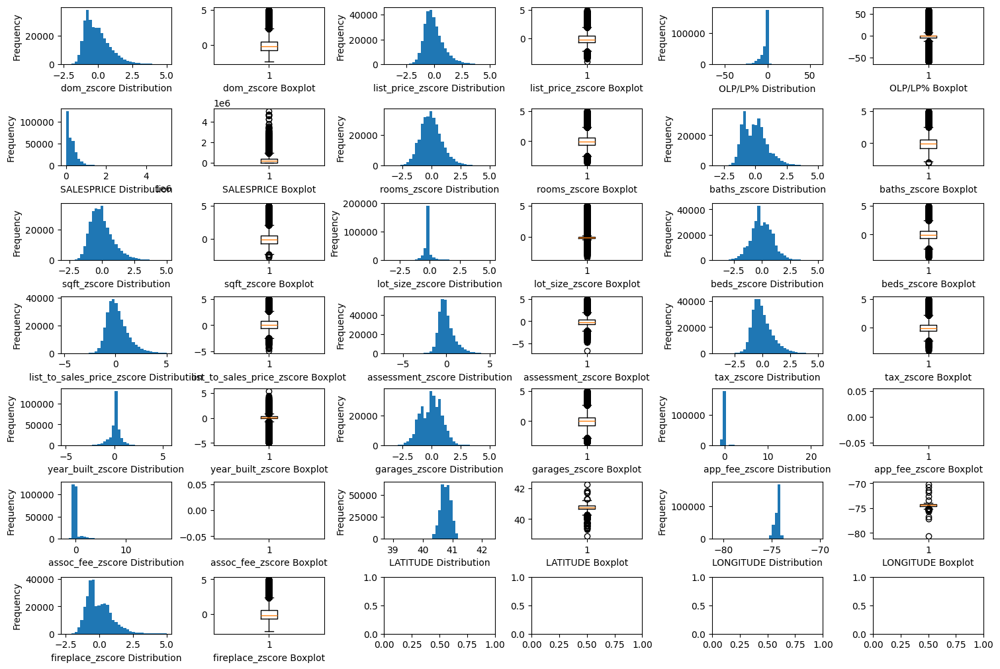

In [ ]:
from matplotlib import pyplot as plt
from itertools import product

fig, axs = plt.subplots(nrows=7, ncols=6, figsize=(15, 10), layout='constrained')

for col, combo in zip(target_col_plot, axises):

    if combo[1] % 2 == 0:
      axs[combo[0], combo[1]].hist(gsmls_data[col], bins=35)
      axs[combo[0], combo[1]].set_xlabel(f'{col} Distribution')
      axs[combo[0], combo[1]].set_ylabel('Frequency')
    else:
      axs[combo[0], combo[1]].boxplot(gsmls_data[col])
      axs[combo[0], combo[1]].set_xlabel(f'{col} Boxplot')

plt.show()

In [ ]:
raw_data2 = gsmls_data.copy()

In [ ]:
raw_data2.reset_index(drop=True, inplace=True)

In [ ]:
batch_size = 100000

# Save the data sample to PostgreSQL
for i in range(0, len(raw_data2), batch_size):

  batch = raw_data2.loc[i:i+batch_size]
  batch.to_sql('cleaned_data_for_dnn', tax_engine, if_exists='append', index=False)

# END OF GSMLS Cleaning 2